tuto on : https://smorabit.github.io/tutorials/8_velocyto/

In [1]:
import scanpy as sc
import anndata
from scipy import io
from scipy.sparse import coo_matrix, csr_matrix
import numpy as np
import os
import pandas as pd
import scvelo as scv

## Import R data

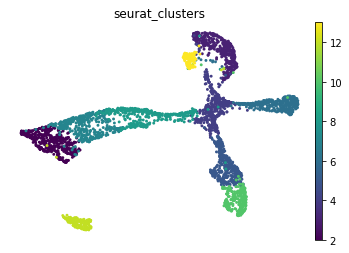

In [2]:
# load sparse matrix:
X = io.mmread("data/counts.mtx")

# create anndata object
adata = anndata.AnnData(
    X=X.transpose().tocsr()
)

# load cell metadata:
cell_meta = pd.read_csv("data/metadata.csv")

# load gene names:
with open("data/gene_names.csv", 'r') as f:
    gene_names = f.read().splitlines()

# set anndata observations and index obs by barcodes, var by gene names
adata.obs = cell_meta
adata.obs.index = adata.obs['barcode']
adata.var.index = gene_names

# load dimensional reduction:
pca = pd.read_csv("data/pca.csv")
pca.index = adata.obs.index

# set pca and umap
adata.obsm['X_pca'] = pca.to_numpy()
adata.obsm['X_umap'] = np.vstack((adata.obs['UMAP_1'].to_numpy(), adata.obs['UMAP_2'].to_numpy())).T

# plot a UMAP colored by sampleID to test:
sc.pl.umap(adata, color=['seurat_clusters'], frameon=False, save=True)

# save dataset as anndata format
adata.write('data/my_data.h5ad')

# reload dataset
adata = sc.read_h5ad('data/my_data.h5ad')


In [3]:
#labels = ["RGC 1", "Neuroblast-G2M", "Neuroblast-G1", "Amacrine", "Photoreceptors", "RGC 2", "U/RGC", "Amacrine/Horizontal", "12", "13"]
#adata.rename_categories('seurat_clusters', labels)
#sc.pl.umap(adata, frameon=False, color='seurat_clusters', legend_loc='on data', title='')

In [4]:
#adata.obs

## Pre-processing of RNA velocity data

In [5]:
adata = sc.read_h5ad('data/my_data.h5ad')

scv.settings.verbosity = 3
scv.settings.set_figure_params('scvelo', facecolor='white', dpi=100, frameon=False)

# load loom files for spliced/unspliced matrices for each sample:
lane1 = scv.read('data/lane1.loom', cache=True)
lane2 = scv.read('data/lane2.loom', cache=True)

In [6]:
# Same id as 10x
lane1.obs.index = [f'Lane1_{cell_id[19:-1]}' for cell_id in lane1.obs.index]
lane1.obs.index

Index(['Lane1_AAATGCCTCACCCGAG', 'Lane1_AAGACCTAGTCCCACG',
       'Lane1_AACTCCCTCTAACTTC', 'Lane1_AAGGAGCCAAGTAATG',
       'Lane1_AAACGGGCACTGAAGG', 'Lane1_AAGGAGCAGTGTACGG',
       'Lane1_AACCGCGGTGTGACCC', 'Lane1_AAATGCCAGTCACGCC',
       'Lane1_AACTTTCCAGGGAGAG', 'Lane1_AACTCCCCAGACAAAT',
       ...
       'Lane1_TTGTAGGGTCTCAACA', 'Lane1_TTGACTTTCCACGCAG',
       'Lane1_TTGCCGTCACCCTATC', 'Lane1_TTTCCTCCAATGGACG',
       'Lane1_TTGGCAACAGGCAGTA', 'Lane1_TTGACTTAGTATCTCG',
       'Lane1_TTTGCGCAGACCTAGG', 'Lane1_TTGGAACCAACTGCGC',
       'Lane1_TTGACTTCACCTTGTC', 'Lane1_TTTATGCGTGTTGAGG'],
      dtype='object', length=2675)

In [7]:
# Same id as 10x
lane2.obs.index = [f'Lane2_{cell_id[18:-1]}' for cell_id in lane2.obs.index]
lane2.obs.index

Index(['Lane2_AAGCCGCTCGCGTAGC', 'Lane2_AAATGCCGTTATCCGA',
       'Lane2_AAACGGGCACGGCGTT', 'Lane2_AACTCAGCACAAGCCC',
       'Lane2_AAAGATGTCACATGCA', 'Lane2_AACCGCGGTGGTACAG',
       'Lane2_AAACGGGAGGCAATTA', 'Lane2_AAAGATGAGAGGGCTT',
       'Lane2_AACTGGTAGCTAGTGG', 'Lane2_AAAGTAGGTCATACTG',
       ...
       'Lane2_TTGTAGGGTAGCGATG', 'Lane2_TTGGAACCAGACACTT',
       'Lane2_TTGCCGTGTCCTAGCG', 'Lane2_TTTGTCATCCCACTTG',
       'Lane2_TTTGCGCGTCAGAAGC', 'Lane2_TTTATGCAGCCAACAG',
       'Lane2_TTGGAACTCCACGTTC', 'Lane2_TTTATGCTCTGATTCT',
       'Lane2_TTTGCGCAGCCAGTTT', 'Lane2_TTTACTGAGGAATTAC'],
      dtype='object', length=2673)

In [8]:
print(lane2.shape)
print(lane1.shape)

(2673, 28692)
(2675, 28692)


In [9]:
lane1.var_names_make_unique()
lane2.var_names_make_unique()
print(lane2.shape)
print(lane1.shape)

(2673, 28692)
(2675, 28692)


In [10]:
data_velo = lane1.concatenate([lane2])

In [11]:
print(data_velo.shape)
print(adata.shape)

(5348, 28692)
(3571, 15176)


In [12]:
# adata = data 10 x
adata = scv.utils.merge(adata, data_velo)

In [13]:
adata

AnnData object with n_obs × n_vars = 3571 × 15152
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'RNA_nn_res.0.8', 'seurat_clusters', 'barcode', 'UMAP_1', 'UMAP_2', 'sample_batch', 'Clusters', '_X', '_Y', 'batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    obsm: 'X_pca', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

## Data analysis 1

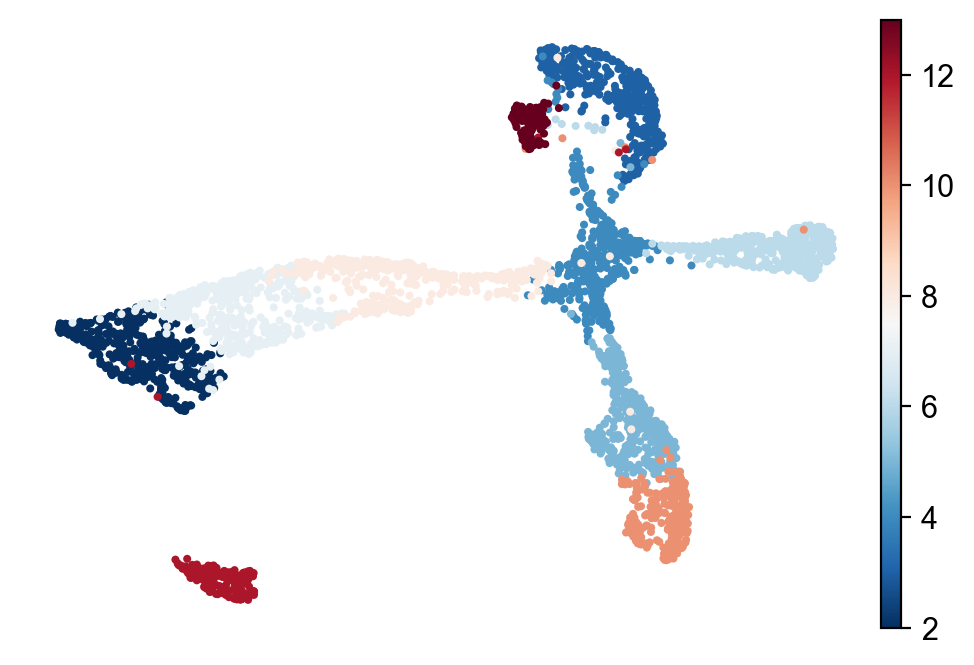

In [14]:
sc.pl.umap(adata, frameon=False, color='seurat_clusters', legend_loc='on data', title='') 

In [15]:
scv.pp.filter_and_normalize(adata)
scv.pp.moments(adata)

Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:11) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:04) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [16]:
scv.tl.velocity(adata, mode='stochastic')
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:11) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/4 cores)



    finished (0:00:29) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_embedding.pdf


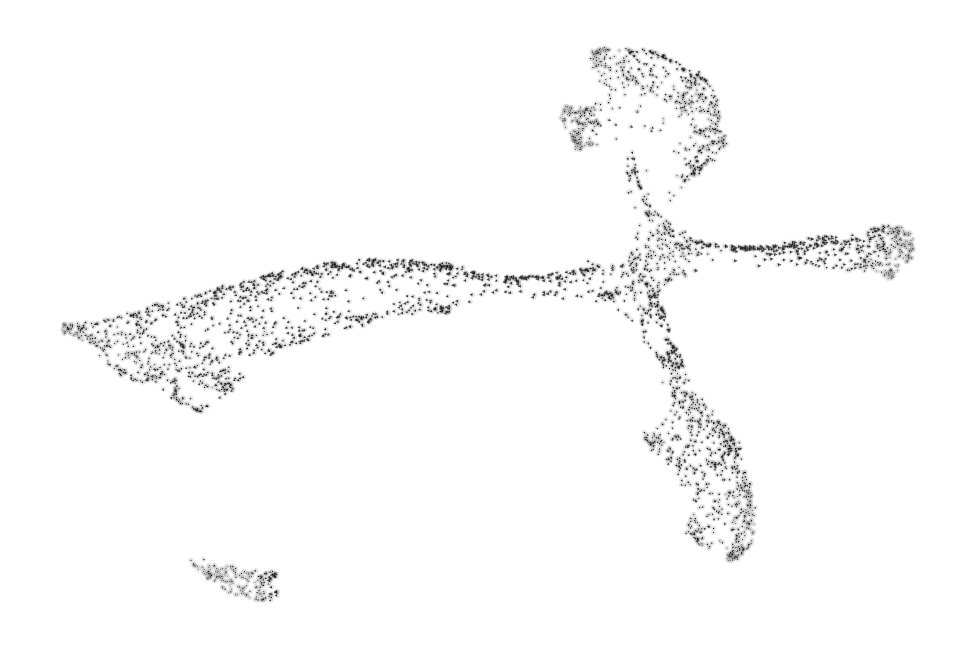

In [17]:
scv.pl.velocity_embedding(adata, basis='umap', frameon=False, save='embedding.pdf')

saving figure to file ./figures/scvelo_embedding_grid.pdf


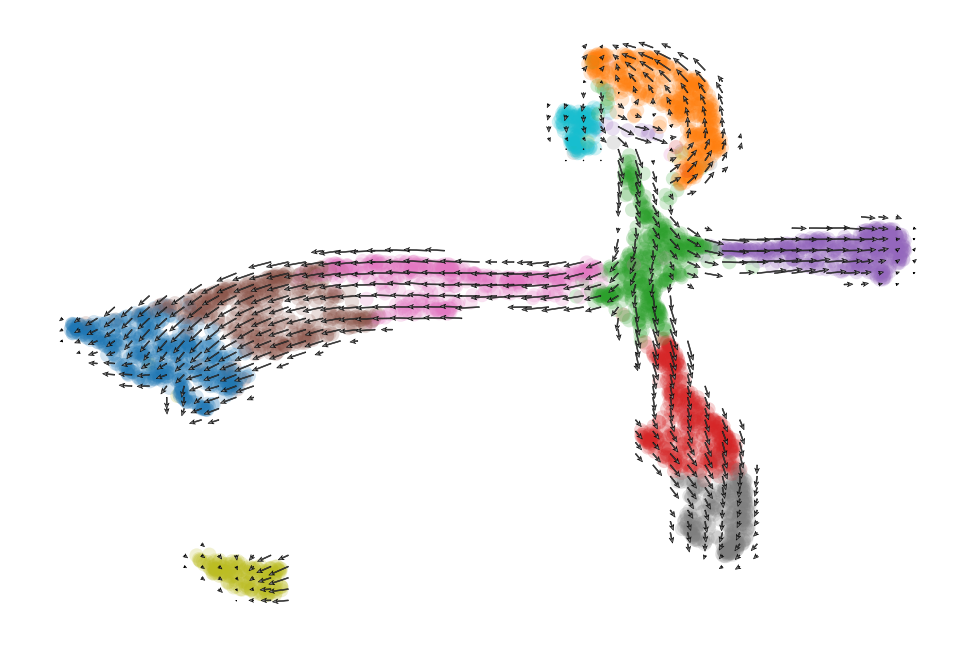

In [18]:
scv.pl.velocity_embedding_grid(adata, basis='umap', color=['seurat_clusters'], save='embedding_grid.pdf', title='', scale=0.25)

In [103]:

#scv.set_figure_params(figsize=[10,10])
#fits : str or list of str (default: [‘velocity’, ‘dynamics’])

#scv.pl.velocity(adata, var_names=['Pou3f1', 'Dlx1'], color=['seurat_clusters'])

In [104]:
#scv.pl.velocity(adata, var_names=['mt-Co3', 'Ebf1', 'mt-Atp6', 'H3f3b', 'mt-Nd1', 'mt-Cytb', 'mt-Nd4', 'mt-Co1', 'mt-Co2', 'Rpl37a', 'Rpl41', 'Rps23', 'Rpl35', 'Rpl32'], color=['seurat_clusters'])

In [105]:
#colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
#colorsComb = np.vstack([colors2])
#mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
#my_cmap = mymap(np.arange(mymap.N))
#my_cmap[:,-1] = np.linspace(0, 1, mymap.N)
#my_cmap = colors.ListedColormap(my_cmap)

#sc.pl.umap(adata, color=['Pax6'], color_map=my_cmap, show=False, frameon=False)

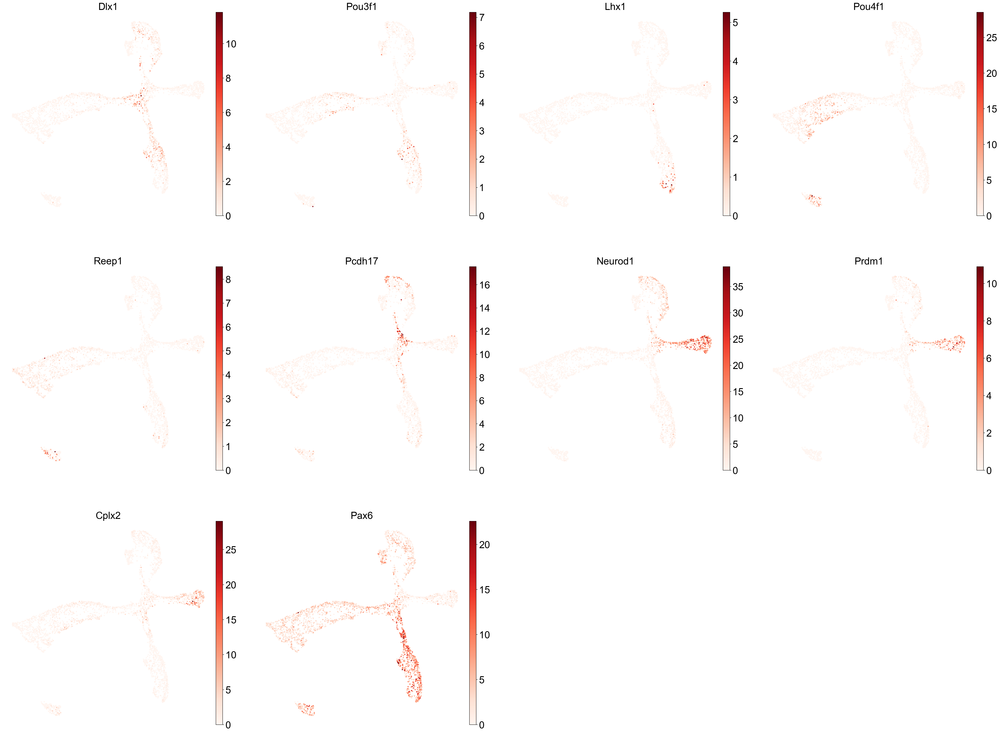

In [19]:
scv.settings.verbosity = 10
scv.settings.set_figure_params('scvelo', facecolor='white', dpi=400, frameon=False)
sc.set_figure_params(scanpy=True, fontsize=25)

from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color=['Dlx1','Pou3f1', 'Lhx1', 'Pou4f1', 'Reep1'
                            , 'Pcdh17', 'Neurod1', 'Prdm1', 'Cplx2', 'Pax6'], color_map='Reds', show=False, frameon=False, ncols=4) #,save='mRNA_count_genes.pdf')


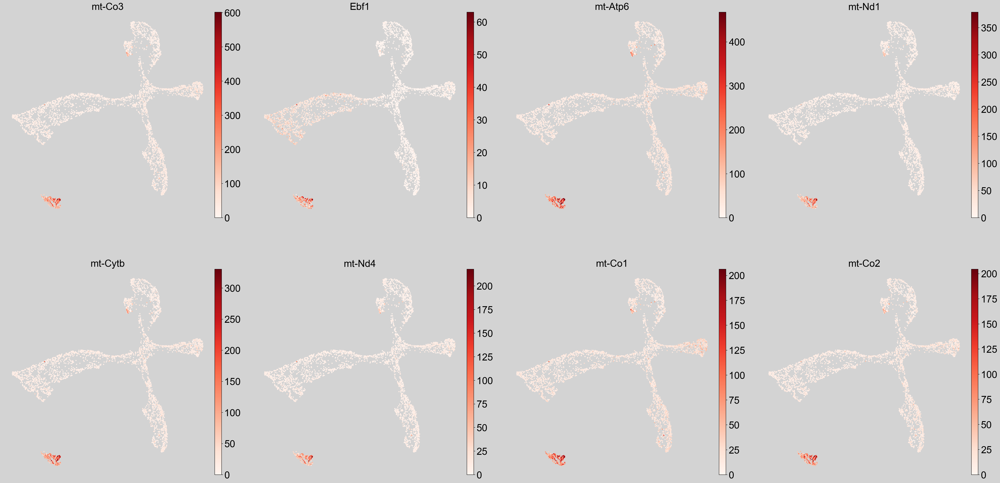

In [107]:
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color=['mt-Co3', 'Ebf1', 'mt-Atp6', 'mt-Nd1', 'mt-Cytb', 'mt-Nd4', 'mt-Co1', 'mt-Co2'],
               color_map='Reds', show=False, frameon=False, ncols=4)  #, save='yellow_cluster.pdf')

In [108]:
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(adata, color=[ 'Pou4f1'
                            , 'Pcdh17', 'Neurod1', 'Pax6', 'mt-Co3', 'Ebf1', 'mt-Atp6', 'mt-Nd1', 'Synm'
                            , 'Myt1l', 'Snhg11', 'Fxyd7'],
               color_map='Reds', show=False, frameon=False, ncols=4, save='mix_redmap_genes2.pdf')

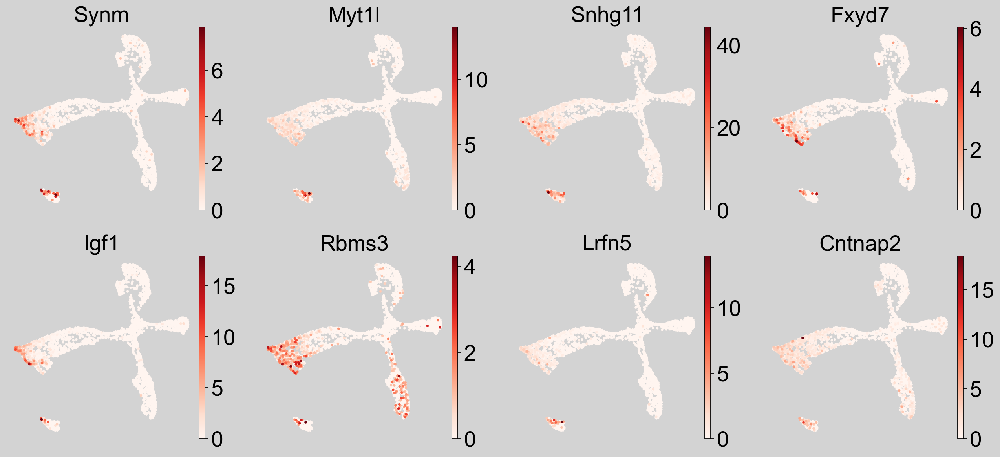

In [109]:
# See if difference between the separation of the blue cluster     

with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(adata, color=[ 'Synm'
                            , 'Myt1l', 'Snhg11', 'Fxyd7', 'Igf1', 'Rbms3', 'Lrfn5', 'Cntnap2'],
               color_map='Reds', show=False, frameon=False)

In [39]:
sc.set_figure_params(scanpy=True, fontsize=30)
with rc_context({'figure.figsize': (3, 3)}):
    sc.pl.umap(adata, color=['Pou4f1','Pcdh17', 'Neurod1', 'Pax6', 'mt-Co3', 'Ebf1', 'mt-Atp6', 'mt-Nd1','Synm'
                            , 'Myt1l', 'Snhg11', 'Fxyd7'],
               color_map='Reds', show=False, frameon=False, save='final_fig2.pdf')

## Data analysis 2

In [27]:
# Identify important genes
# Explain the previous velocity disparities (points (2) & (3) before) by identifying the genes that explain the vector field 
scv.tl.rank_velocity_genes(adata, groupby='seurat_clusters', min_corr=.3)

df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:43) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,2,3,4,5,6,7,8,10,12,13
0,Kirrel3,BC030867,Dcc,Runx1t1,Kif19a,Nell2,Adarb2,Anks1b,Elavl4,Shroom3
1,Meg3,Rad54b,Nckap5,Plxdc2,Kcnd3,Prune2,Gap43,Sorcs2,Pid1,Tcf7l2
2,Scn9a,Robo1,Tubb3,Ipcef1,Zfp385b,Ntrk2,Igfbpl1,Nedd4l,Rbms3,Col23a1
3,Pcdh9,Ect2,Nxn,Ghr,Cadm2,Reep1,Nsg2,Zfpm2,Fgf12,Bmpr1b
4,Ccdc85a,Cdc25c,Epha3,Mylk,Gabrb3,Mtus2,Cntn2,Akap6,Lrfn2,Wdr76


Clusters that have a different vectors field = blue (2, RGC) and orange (3, Neuroblasts)

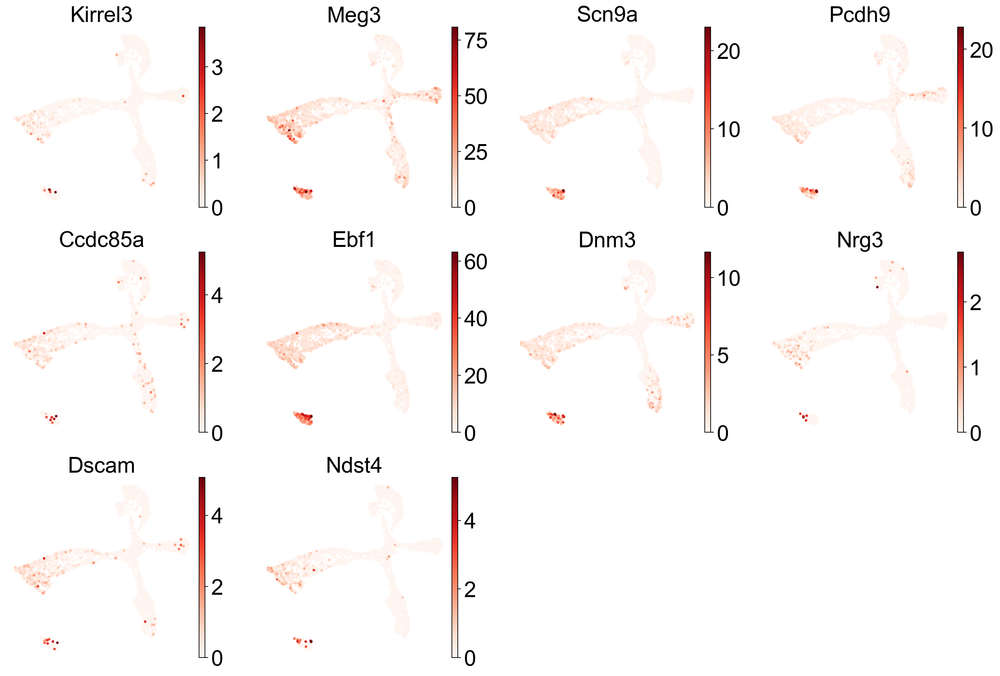

In [28]:
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(adata, color = df['2'][:10] ,
               color_map='Reds', show=False, frameon=False)

saving figure to file ./figures/scvelo_un_spliced.pdf


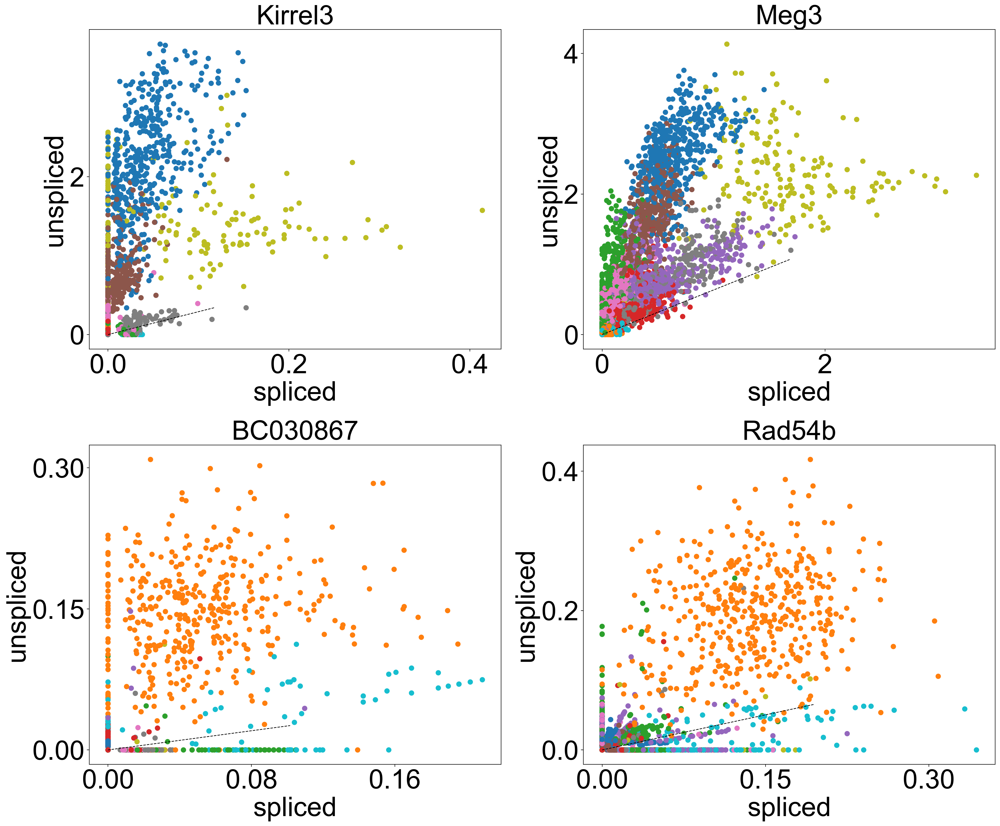

In [57]:
scv.settings.set_figure_params('scvelo', facecolor='white', dpi=100, frameon=False, fontsize=40)
with rc_context({'figure.figsize': (12, 10)}):
    scv.pl.scatter(adata, ['Kirrel3', 'Meg3', 'BC030867', 'Rad54b'], color=['seurat_clusters'], save='un_spliced.pdf', size=250, ncols=2)

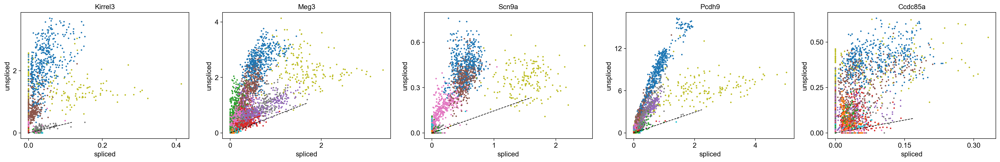

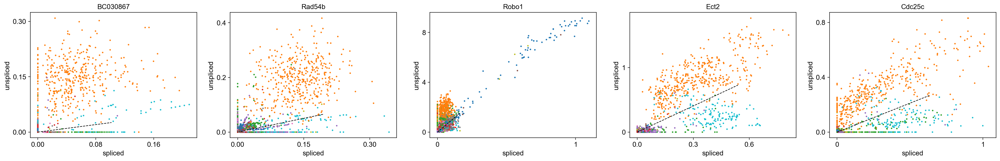

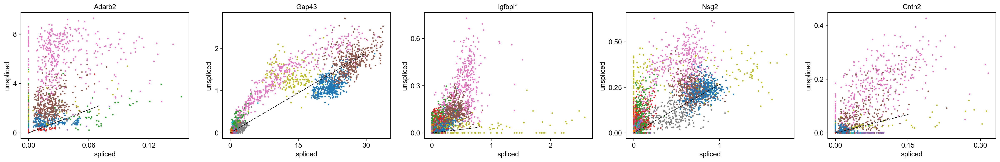

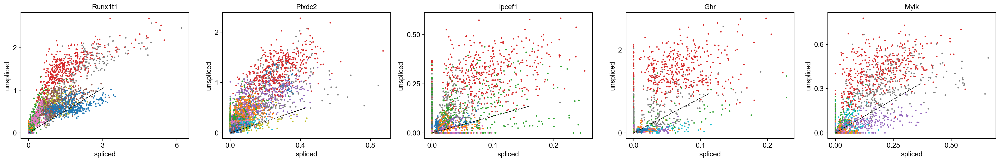

In [35]:
scv.settings.set_figure_params('scvelo', facecolor='white', dpi=100, frameon=False)
scv.pl.scatter(adata, df['2'][:5], color=['seurat_clusters']) #blue
scv.pl.scatter(adata, df['3'][:5], color=['seurat_clusters']) #orange
scv.pl.scatter(adata, df['8'][:5], color=['seurat_clusters']) #pink
scv.pl.scatter(adata, df['5'][:5], color=['seurat_clusters']) #red

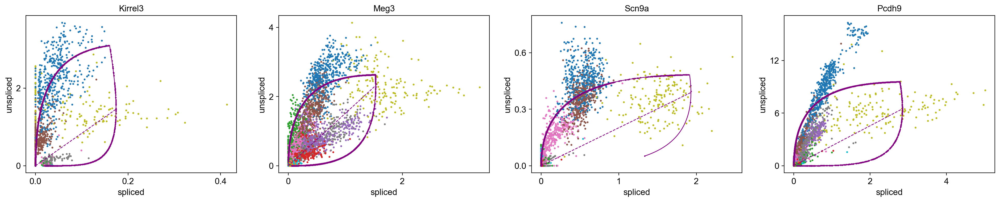

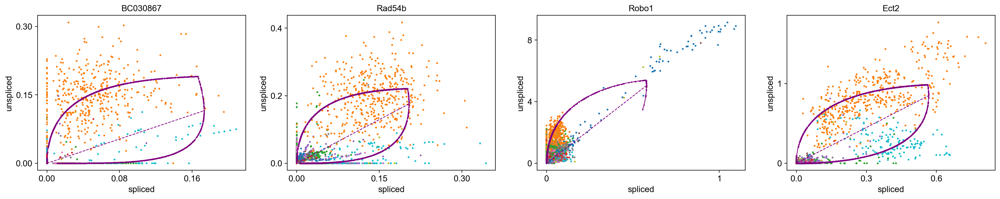

In [73]:
scv.pl.scatter(adata, df['2'][:4], color=['seurat_clusters']) 
scv.pl.scatter(adata, df['3'][:4], color=['seurat_clusters']) 

recovering dynamics (using 1/4 cores)



    finished (0:14:18) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing terminal states
    identified 4 regions of root cells and 3 regions of end points .
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:12) --> added 
    'latent_time', shared time (adata.obs)


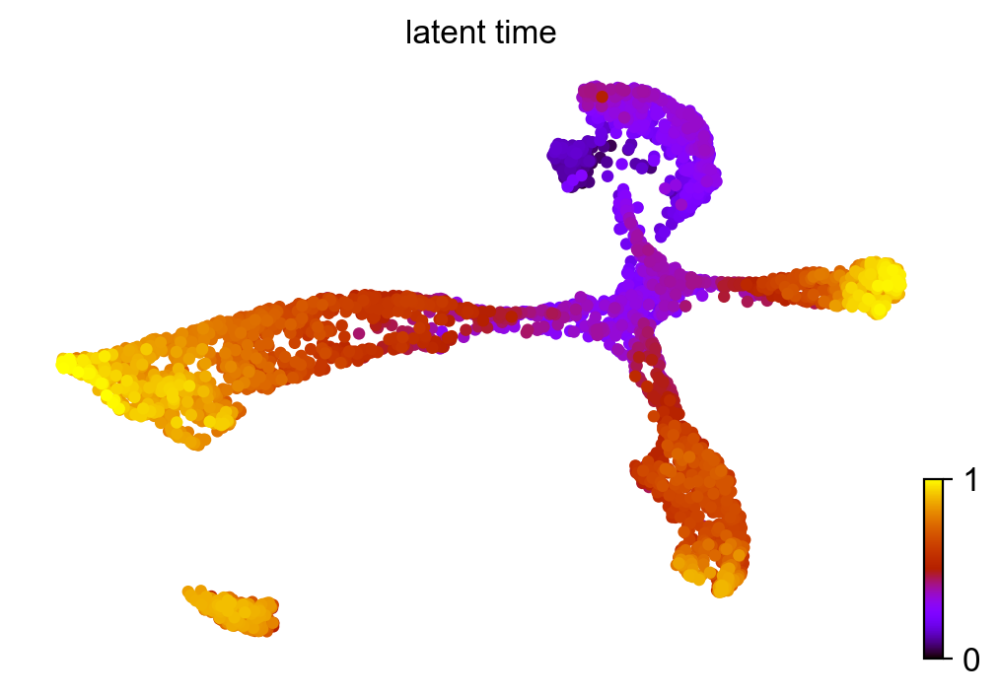

In [37]:
# latent time analysis 
# If you would compute the latent time on the data, what would you expect? All branching/differentiation happening at the same time or some branching + cell differentitation is occurring faster?
scv.tl.recover_dynamics(adata)
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80, save = 'da2.pdf')

In [38]:
# Branch RGC = 2,7,8
# Branch Neuroblast = 3,4
# Branch AC/HC = 5,10
RGC = adata[adata.obs['seurat_clusters'].isin(['2','7', '8'])]
Neuroblast = adata[adata.obs['seurat_clusters'].isin(['3','4'])]
AC = adata[adata.obs['seurat_clusters'].isin(['5','10'])]

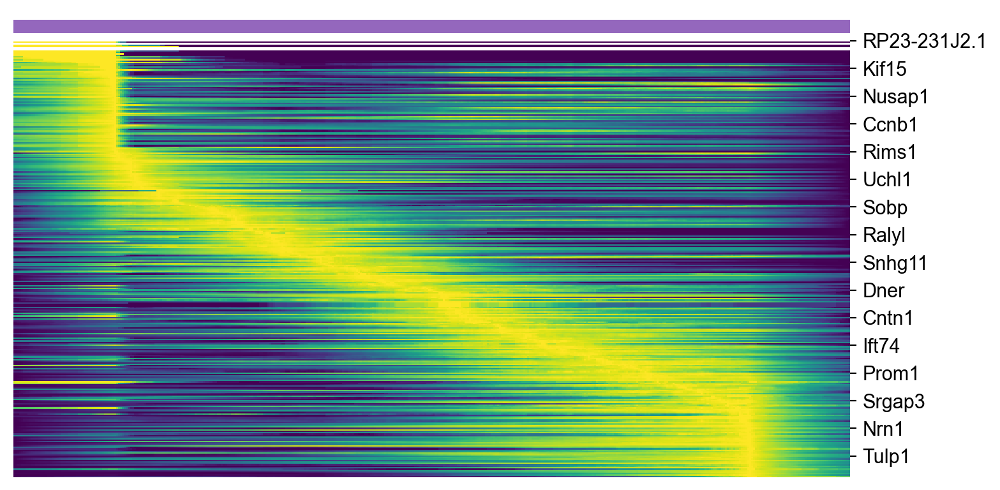

In [84]:
PR = adata[adata.obs['seurat_clusters'].isin(['6'])]
top_genes = PR.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(PR, var_names=top_genes, sortby='latent_time', col_color='seurat_clusters', n_convolve=100)

saving figure to file ./figures/scvelo_heatmap_RGC.pdf


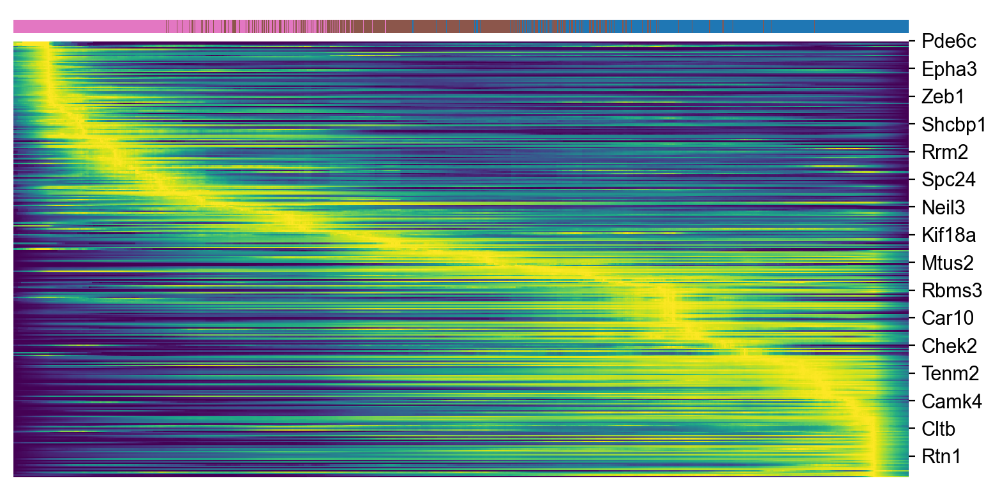

In [44]:
top_genes = RGC.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(RGC, var_names=top_genes, sortby='latent_time', col_color='seurat_clusters', n_convolve=100, save = 'RGC.pdf')

saving figure to file ./figures/scvelo_heatmap_neuroblast.pdf


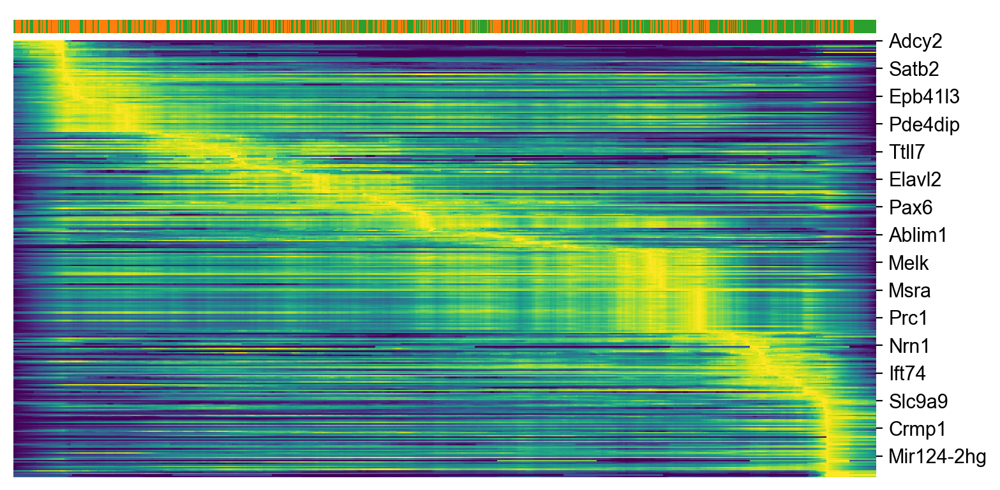

In [45]:
top_genes = Neuroblast.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(Neuroblast, var_names=top_genes, sortby='latent_time', col_color='seurat_clusters', n_convolve=100, save = 'neuroblast.pdf')

saving figure to file ./figures/scvelo_heatmap_AC.pdf


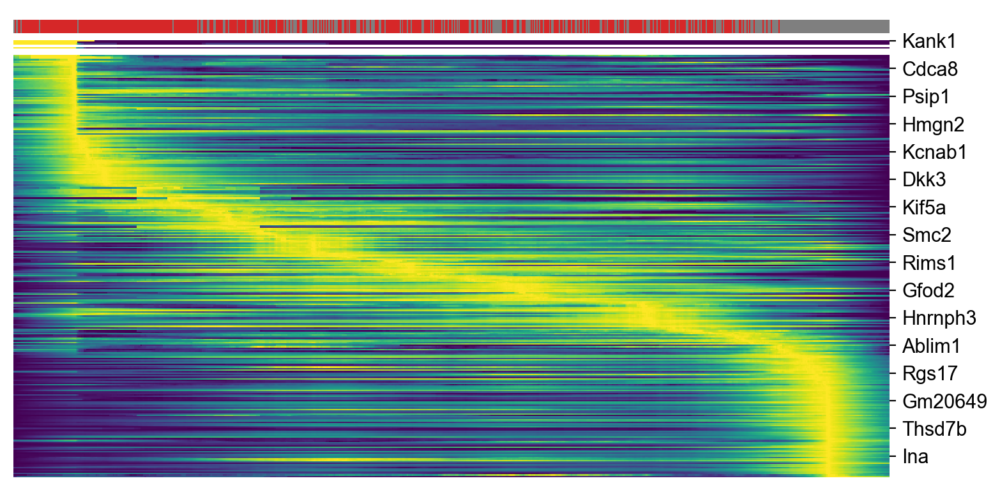

In [46]:
top_genes = AC.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(AC, var_names=top_genes, sortby='latent_time', col_color='seurat_clusters', n_convolve=100, save = 'AC.pdf')

saving figure to file ./figures/scvelo_heatmap_all.pdf


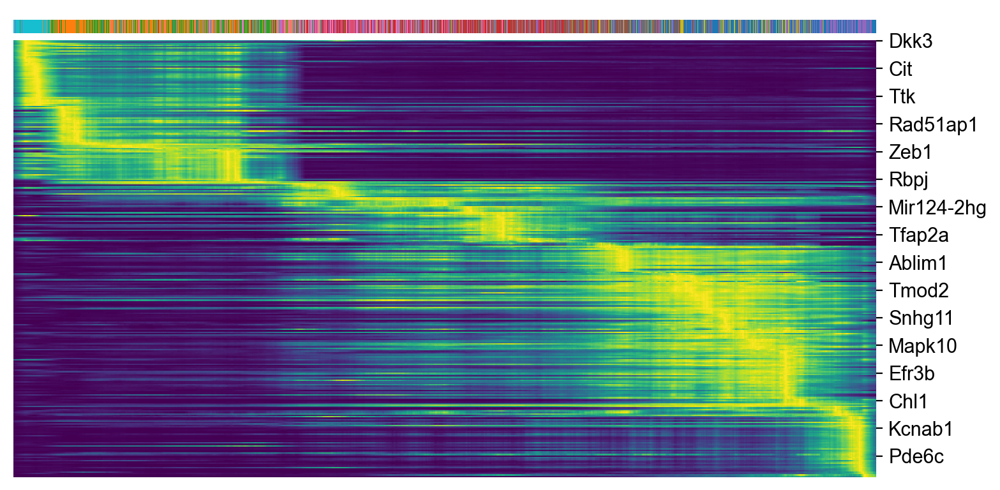

In [48]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color='seurat_clusters', n_convolve=100, save = 'all.pdf')

In [68]:
S_genes_hum = ["MCM5", "PCNA", "TYMS", "FEN1", "MCM2", "MCM4", "RRM1", "UNG", "GINS2", 
            "MCM6", "CDCA7", "DTL", "PRIM1", "UHRF1", "CENPU", "HELLS", "RFC2", 
            "RPA2", "NASP", "RAD51AP1", "GMNN", "WDR76", "SLBP", "CCNE2", "UBR7", 
            "POLD3", "MSH2", "ATAD2", "RAD51", "RRM2", "CDC45", "CDC6", "EXO1", "TIPIN", 
            "DSCC1", "BLM", "CASP8AP2", "USP1", "CLSPN", "POLA1", "CHAF1B", "BRIP1", "E2F8"]
 
G2M_genes_hum = ["HMGB2", "CDK1", "NUSAP1", "UBE2C", "BIRC5", "TPX2", "TOP2A", "NDC80",
             "CKS2", "NUF2", "CKS1B", "MKI67", "TMPO", "CENPF", "TACC3", "PIMREG", 
             "SMC4", "CCNB2", "CKAP2L", "CKAP2", "AURKB", "BUB1", "KIF11", "ANP32E", 
             "TUBB4B", "GTSE1", "KIF20B", "HJURP", "CDCA3", "JPT1", "CDC20", "TTK",
             "CDC25C", "KIF2C", "RANGAP1", "NCAPD2", "DLGAP5", "CDCA2", "CDCA8", "ECT2", 
             "KIF23", "HMMR", "AURKA", "PSRC1", "ANLN", "LBR", "CKAP5", "CENPE", 
             "CTCF", "NEK2", "G2E3", "GAS2L3", "CBX5", "CENPA"]

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)
saving figure to file ./figures/scvelo_cell_cycle.pdf


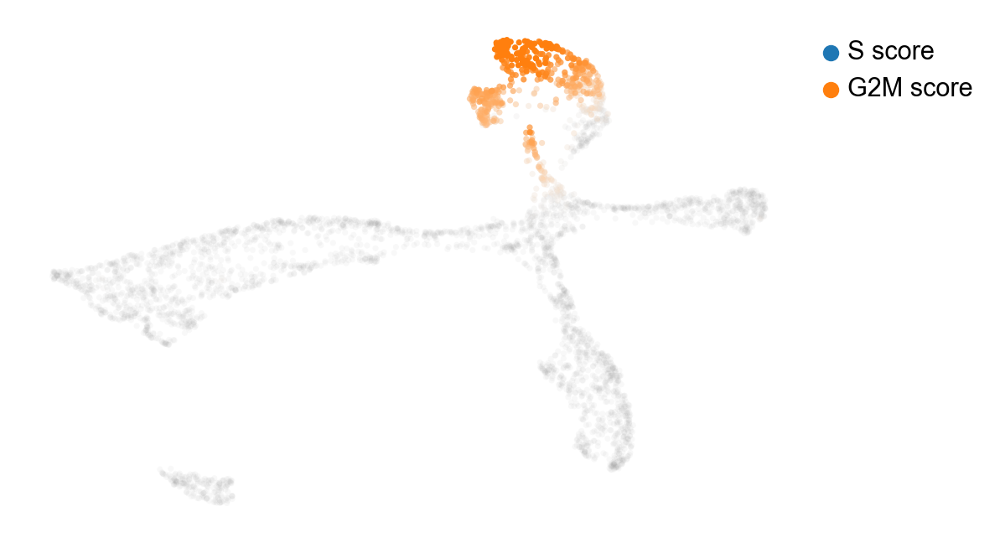

In [71]:
scv.tl.score_genes_cell_cycle(adata) #, s_genes=S_genes_hum, g2m_genes=G2M_genes_hum)
scv.pl.scatter(adata, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95], save = 'cell_cycle.pdf')